# Problem Statement

# Importing the necessary libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from warnings import filterwarnings
filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/Drive')

Mounted at /content/Drive


In [ ]:
import os
os.chdir('/content/Drive/My Drive/CSV files for Analytics/FRA')

In [ ]:
d1 = pd.read_excel('Company_Data2015-1.xlsx')
d1.head()


,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,...,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,...,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,...,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,...,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,...,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


In [ ]:
d1.shape

(3586, 67)

In [ ]:
pd.set_option('display.max_columns',None)
d1.head()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Gross Sales,Net Sales,Other Income,Value Of Output,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted PAT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Market Capitalisation,CEPS (annualised) (Unit Curr),Cash Flow From Operating Activities,Cash Flow From Investing Activities,Cash Flow From Financing Activities,ROG-Net Worth (%),ROG-Capital Employed (%),ROG-Gross Block (%),ROG-Gross Sales (%),ROG-Net Sales (%),ROG-Cost of Production (%),ROG-Total Assets (%),ROG-PBIDT (%),ROG-PBDT (%),ROG-PBIT (%),ROG-PBT (%),ROG-PAT (%),ROG-CP (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Total Asset Turnover Ratio[Latest],Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


In [ ]:
d1.describe()

,Co_Code,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Gross Sales,Net Sales,Other Income,Value Of Output,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted PAT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Market Capitalisation,CEPS (annualised) (Unit Curr),Cash Flow From Operating Activities,Cash Flow From Investing Activities,Cash Flow From Financing Activities,ROG-Net Worth (%),ROG-Capital Employed (%),ROG-Gross Block (%),ROG-Gross Sales (%),ROG-Net Sales (%),ROG-Cost of Production (%),ROG-Total Assets (%),ROG-PBIDT (%),ROG-PBDT (%),ROG-PBIT (%),ROG-PBT (%),ROG-PAT (%),ROG-CP (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Total Asset Turnover Ratio[Latest],Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
count,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3.582000e+03,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3.586000e+03,3.586000e+03,3586.000000,3586.000000,3586.000000,3586.000000,3.586000e+03,3.586000e+03,3.586000e+03,3.586000e+03,3.586000e+03,3586.000000,3586.000000,3586.000000,3586.000000,3586.000000,3585.000000,3585.00000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3585.000000,3586.000000,3.586000e+03,3483.000000,3586.000000,3586.000000
mean,16065.388734,725.045251,62.966584,649.746299,2799.611054,1994.823779,594.178829,410.809665,1960.349172,391.992078,1778.453751,1123.738985,1079.702579,48.729824,1077.187292,798.544621,25.554997,248.175282,116.268795,217.659395,85.752909,61.218313,60.058963,91.734200,131.165270,256.327002,7.655689,157.237836,2.243153e+03,1664.092387,36.018709,65.770750,-60.870365,11.436453,1.237625e+03,2.988885e+03,37.554306,242.672962,242.588530,310.488405,2.793283e+03,3.758522e+02,3.363799e+02,3.747000e+02,2.240702e+02,112.231654,221.091523,37.227844,364.863221,63.682220,12.056603,51.53884,37.798946,33.026996,1.237236,16.387894,-51.162890,-109.213414,-311.570357,-307.005632,-365.056187,603.894032,2.057855e+03,79.644559,0.819757,61.884548
std,19776.817379,4769.681004,778.761744,4091.988792,26975.135385,23652.842746,4871.547802,6301.218546,22577.570829,2675.001631,11437.574690,10603.703837,9996.574173,426.040665,9843.880293,9076.702982,194.244466,1949.593350,956.199566,1850.972782,799.925768,620.298432,580.432912,780.790561,1150.730209,4132.339619,111.432070,1622.664105,1.282837e+05,12805.173084,828.420796,1455.048376,701.974713,1272.257361,4.104193e+04,1.264729e+05,893.619402,6103.527897,6103.487655,5573.215095,1.259417e+05,2.327840e+04,2.035340e+04,2.246279e+04,1.965923e+04,13480.515287,13980.202791,658.666041,15233.643027,1047.928144,108.410131,681.15091,458.189394,489.563498,2.673228,351.737840,1795.131025,3057.635870,10921.592639,10676.149629,12500.051387,10636.759580,5.416948e+04,137.847792,1.201400,976.824352
min,4.000000,-8021.600000,0.000000,-7027.480000,-1824.750000,-0.720000,-41.190000,-13162.420000,-0.910000,-0.230000,-4.510000,-62.590000,-62.590000,-448.720000,-119.100000,-22.650000,0.000000,-4655.140000,-5874.530000,-4812.950000,-6032.340000,-6032.340000,-4418.720000,-5874.530000,0.000000,0.000000,0.000000,-3371.570000,-3.371570e+04,0.000000,-1808.000000,-25

In [ ]:
d1.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Co_Code,3586.0,NaN,NaN,NaN,16065.388734,19776.817379,4.0,3029.25,6077.5,24269.5,72493.0
Co_Name,3586,3586,Hind.Cables,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Networth Next Year,3586.0,NaN,NaN,NaN,725.045251,4769.681004,-8021.6,3.985,19.015,123.8025,111729.1
Equity Paid Up,3586.0,NaN,NaN,NaN,62.966584,778.761744,0.0,3.75,8.29,19.5175,42263.46
Networth,3586.0,NaN,NaN,NaN,649.746299,4091.988792,-7027.48,3.8925,18.58,117.2975,81657.35
...,...,...,...,...,...,...,...,...,...,...,...
Debtors Velocity (Days),3586.0,NaN,NaN,NaN,603.894032,10636.75958,0.0,8.0,49.0,106.0,514721.0
Creditors Velocity (Days),3586.0,NaN,NaN,NaN,2057.854992,54169.479197,0.0,8.0,39.0,89.0,2034145.0
Inventory Velocity (Days),3483.0,NaN,NaN,NaN,79.644559,137.847792,-199.0,0.0,35.0,96.0,996.0
Value of Output/Total Assets,3586.0,NaN,NaN,NaN,0.819757,1.2014,-0.33,0.07,0.48,1.16,17.63


In [ ]:
d1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 67 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Co_Code                              3586 non-null   int64  
 1   Co_Name                              3586 non-null   object 
 2   Networth Next Year                   3586 non-null   float64
 3   Equity Paid Up                       3586 non-null   float64
 4   Networth                             3586 non-null   float64
 5   Capital Employed                     3586 non-null   float64
 6   Total Debt                           3586 non-null   float64
 7   Gross Block                          3586 non-null   float64
 8   Net Working Capital                  3586 non-null   float64
 9   Current Assets                       3586 non-null   float64
 10  Current Liabilities and Provisions   3586 non-null   float64
 11  Total Assets/Liabilities      

In [ ]:
check_dup_company = np.where(d1["Co_Name"].value_counts()>1)
check_dup_company

(array([], dtype=int64),)

In [ ]:
1/d1['Total Assets/Liabilities '].describe()

count    0.000279
mean     0.000562
std      0.000087
min     -0.221729
25%      0.094742
50%      0.019227
75%      0.003220
max      0.000004
Name: Total Assets/Liabilities , dtype: float64

There are no duplicate entries for any company

### Calculated field for levarage (total debt/Paid up Equity)

In [ ]:
d1['leverage'] = d1['Total Debt']/d1['Equity Paid Up']

### Calculating difference in networth

In [ ]:
d1['diff_net_worth'] = d1['Networth Next Year']-d1['Networth']

In [ ]:
d1.head(5)

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block,leverage,diff_net_worth
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,...,0.00,0.00,0.00,0,0,45.0,0.00,0.00,14.154974,-994.12
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,...,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,3.790509,-1018.11
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,...,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,128.984770,-3699.44
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,...,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,14.787349,-2431.02
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,...,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,114.133201,-1896.53


# Basic Exploratory Data Analysis

### Checking for duplicate data across columns and dropping those

In [ ]:
dups = d1.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))


Number of duplicate rows = 0


In [ ]:
print(d1.shape)

(3586, 69)


### Check for missing values and impute the missing values, if any is present.

In [ ]:
pd.set_option('display.max_rows',None)
d1.isna().sum()

Co_Code                                  0
Co_Name                                  0
Networth Next Year                       0
Equity Paid Up                           0
Networth                                 0
Capital Employed                         0
Total Debt                               0
Gross Block                              0
Net Working Capital                      0
Current Assets                           0
Current Liabilities and Provisions       0
Total Assets/Liabilities                 0
Gross Sales                              0
Net Sales                                0
Other Income                             0
Value Of Output                          0
Cost of Production                       0
Selling Cost                             0
PBIDT                                    0
PBDT                                     0
PBIT                                     0
PBT                                      0
PAT                                      0
Adjusted PA

### There are missing values in the dataset

In [ ]:
pd.set_option('display.max_columns',None)
d1[d1['Current Ratio[Latest]'].isnull()]


,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Gross Sales,Net Sales,Other Income,Value Of Output,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted PAT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Market Capitalisation,CEPS (annualised) (Unit Curr),Cash Flow From Operating Activities,Cash Flow From Investing Activities,Cash Flow From Financing Activities,ROG-Net Worth (%),ROG-Capital Employed (%),ROG-Gross Block (%),ROG-Gross Sales (%),ROG-Net Sales (%),ROG-Cost of Production (%),ROG-Total Assets (%),ROG-PBIDT (%),ROG-PBDT (%),ROG-PBIT (%),ROG-PBT (%),ROG-PAT (%),ROG-CP (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Total Asset Turnover Ratio[Latest],Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block,leverage,diff_net_worth
2825,3240,G M Breweries,180.99,11.71,126.2,158.3,32.1,130.8,-7.65,39.86,47.51,205.81,1035.56,516.36,2.36,516.32,263.81,4.11,40.81,34.02,35.25,28.46,18.63,17.55,24.19,0.0,0.0,0.0,107.8,86.24,131.48,20.15,19.79,-12.71,-2.8,10.21,10.62,-4.88,6.07,6.41,8.8,-6.71,-5.12,-8.6,-8.27,-12.81,-13.51,-7.39,0.0,0.0,-11.35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,6,23.0,2.98,5.53,2.741247,54.79


### Removing missing values 

In [ ]:
d1 = d1.dropna()

In [ ]:
pd.set_option('display.max_rows',None)
d1.isna().sum()

Co_Code                                0
Co_Name                                0
Networth Next Year                     0
Equity Paid Up                         0
Networth                               0
Capital Employed                       0
Total Debt                             0
Gross Block                            0
Net Working Capital                    0
Current Assets                         0
Current Liabilities and Provisions     0
Total Assets/Liabilities               0
Gross Sales                            0
Net Sales                              0
Other Income                           0
Value Of Output                        0
Cost of Production                     0
Selling Cost                           0
PBIDT                                  0
PBDT                                   0
PBIT                                   0
PBT                                    0
PAT                                    0
Adjusted PAT                           0
CP              

#### Removing Co_Code and Co_Name as these are of no use/consequence in running logistic regression model

In [ ]:
d1.drop(labels=['Co_Code','Co_Name'],axis=1,inplace=True)
d1.head()

,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Gross Sales,Net Sales,Other Income,Value Of Output,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted PAT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Market Capitalisation,CEPS (annualised) (Unit Curr),Cash Flow From Operating Activities,Cash Flow From Investing Activities,Cash Flow From Financing Activities,ROG-Net Worth (%),ROG-Capital Employed (%),ROG-Gross Block (%),ROG-Gross Sales (%),ROG-Net Sales (%),ROG-Cost of Production (%),ROG-Total Assets (%),ROG-PBIDT (%),ROG-PBDT (%),ROG-PBIT (%),ROG-PBT (%),ROG-PAT (%),ROG-CP (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Total Asset Turnover Ratio[Latest],Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block,leverage,diff_net_worth
0,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,14.154974,-994.12
1,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,3.790509,-1018.11
2,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,128.984770,-3699.44
3,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,14.787349,-2431.02
4,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,114.133201,-1896.53


In [ ]:
print(d1.shape)

(3477, 67)


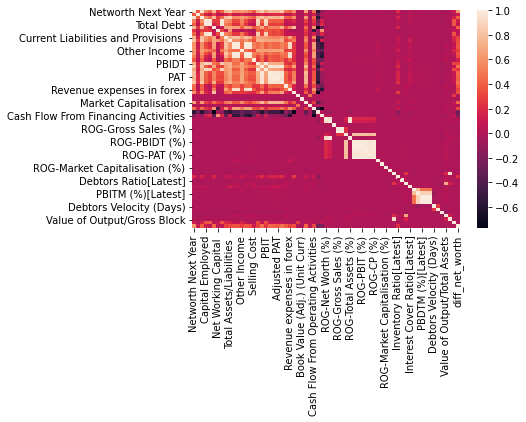

In [ ]:
sns.heatmap(d1.corr())

From drawing a quick correlation heatmap we see that there are some variables that may have high correlation and can be done away with

In [ ]:
plt.rcParams['font.size'] = 10
plt.rcParams['axes.grid'] = True

In [ ]:
cls = ['Total Assets/Liabilities ','PBIDT','ROG-Gross Block (%)','ROG-Cost of Production (%)','ROG-PAT (%)','Current Ratio[Latest]','Inventory Ratio[Latest]', 'Debtors Ratio[Latest]','PBIDTM (%)[Latest]','Debtors Velocity (Days)','Creditors Velocity (Days)', 'Inventory Velocity (Days)']

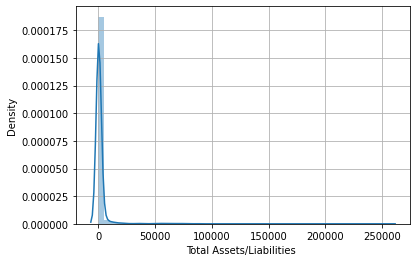

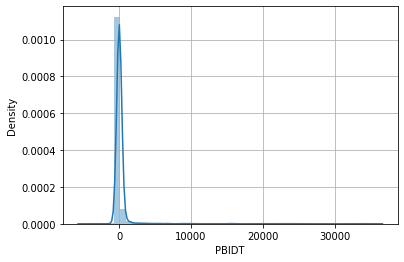

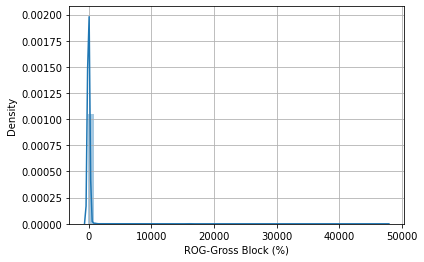

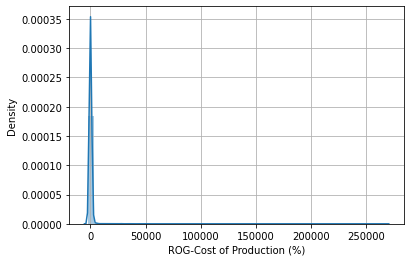

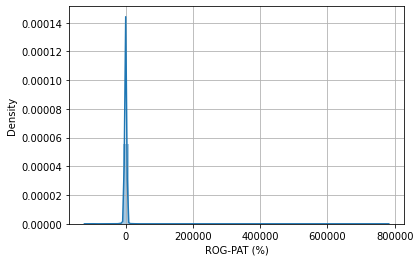

...

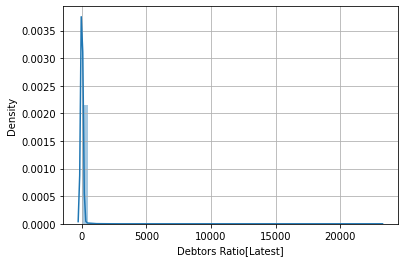

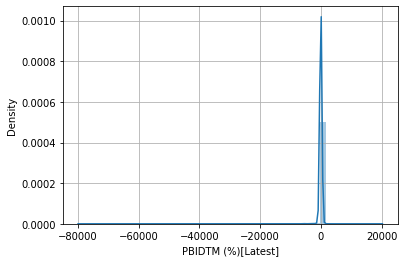

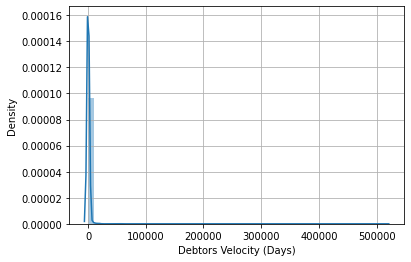

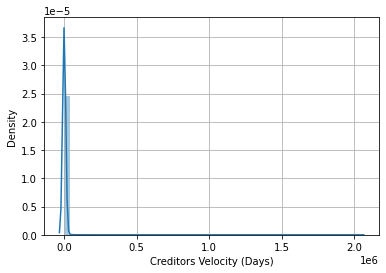

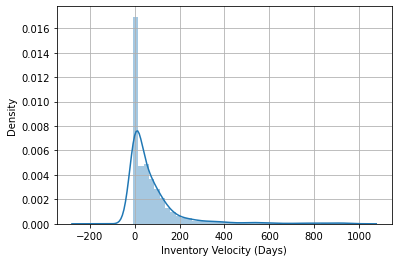

In [ ]:
for i in cls:
    sns.distplot(d1[i])
    plt.show()

### Check the spread of the data using boxplot for the continuous variables.

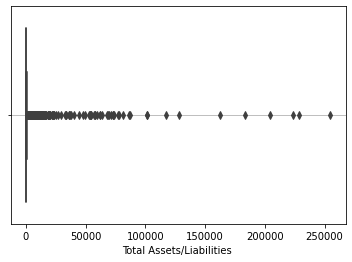

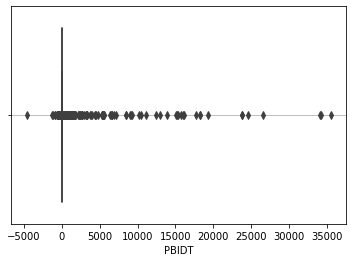

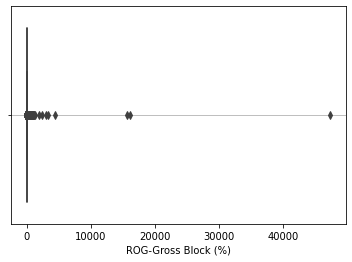

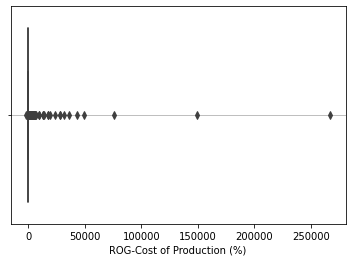

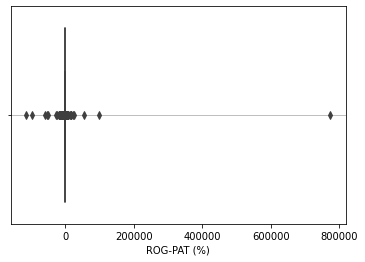

...

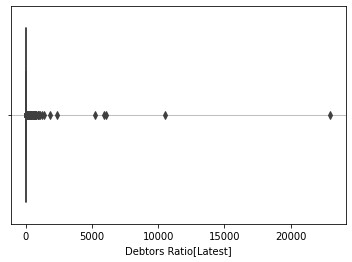

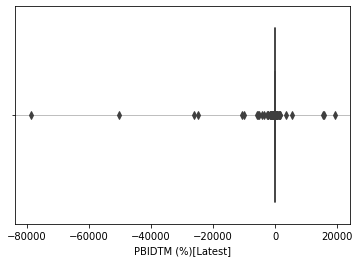

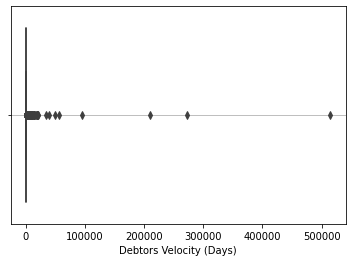

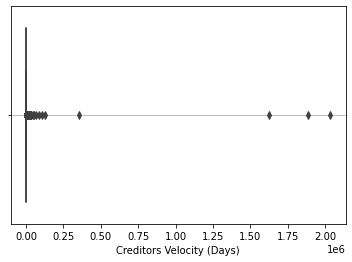

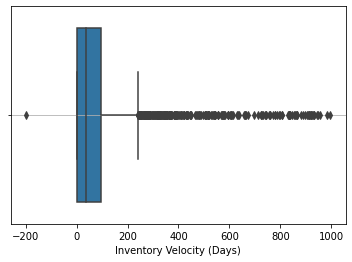

In [ ]:
for i in cls:
    sns.boxplot(d1[i],whis=1.5)
    plt.grid()
    plt.show();

### Treating the outliers at 1.5 * IQR (Inter-Quartile Range). 


In [ ]:
Q1 = d1.quantile(0.25)
Q3 = d1.quantile(0.75)
IQR = Q3 - Q1
pd.DataFrame((((d1 < (Q1 - 1.5 * IQR)) | (d1 > (Q3 + 1.5 * IQR))).sum()/d1.shape[0]*100).round(2),columns=['Outliers %'])

,Outliers %
Networth Next Year,18.75
Equity Paid Up,12.40
Networth,18.15
Capital Employed,16.51
Total Debt,16.11
Gross Block,15.10
Net Working Capital,17.46
Current Assets,16.02
Current Liabilities and Provisions,16.31
Total Assets/Liabilities,15.96


In [ ]:
# # User-defined-Function for getting the Upper and Lower limt acceptance of the outliers at 1.5*IQR. 

def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [ ]:
d1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3477 entries, 0 to 3585
Data columns (total 67 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Networth Next Year                   3477 non-null   float64
 1   Equity Paid Up                       3477 non-null   float64
 2   Networth                             3477 non-null   float64
 3   Capital Employed                     3477 non-null   float64
 4   Total Debt                           3477 non-null   float64
 5   Gross Block                          3477 non-null   float64
 6   Net Working Capital                  3477 non-null   float64
 7   Current Assets                       3477 non-null   float64
 8   Current Liabilities and Provisions   3477 non-null   float64
 9   Total Assets/Liabilities             3477 non-null   float64
 10  Gross Sales                          3477 non-null   float64
 11  Net Sales                     

In [ ]:
## This is a loop to treat outliers for all the non-'object' type varible
for column in d1.columns:
     if d1[column].dtype != 'object': 
        lr,ur=remove_outlier(d1[column])
        d1[column]=np.where(d1[column]>ur,ur,d1[column])
        d1[column]=np.where(d1[column]<lr,lr,d1[column])

In [ ]:
Q1 = d1.quantile(0.25)
Q3 = d1.quantile(0.75)
IQR = Q3 - Q1
pd.DataFrame((((d1 < (Q1 - 1.5 * IQR)) | (d1 > (Q3 + 1.5 * IQR))).sum()/d1.shape[0]*100).round(2),columns=['Outliers %'])

,Outliers %
Networth Next Year,0.0
Equity Paid Up,0.0
Networth,0.0
Capital Employed,0.0
Total Debt,0.0
Gross Block,0.0
Net Working Capital,0.0
Current Assets,0.0
Current Liabilities and Provisions,0.0
Total Assets/Liabilities,0.0


### Creating default variable

In [ ]:
# Basically negative net worth means that your total debt is more than your total assets and you're possibly going to default 
conditions = [
    (d1['Networth Next Year'] <= 0),
    (d1['Networth Next Year'] > 0)
    ]

# create a list of the values we want to assign for each condition
values = ['1', '0']

# create a new column and use np.select to assign values to it using our lists as arguments
d1['default'] = np.select(conditions, values)

d1['default'] = d1['default'].astype('int64')

In [ ]:
d1.default.value_counts()

0    3100
1     377
Name: default, dtype: int64

### Checking for Correlations. Print the correlation matrix and the correlation heatmap.

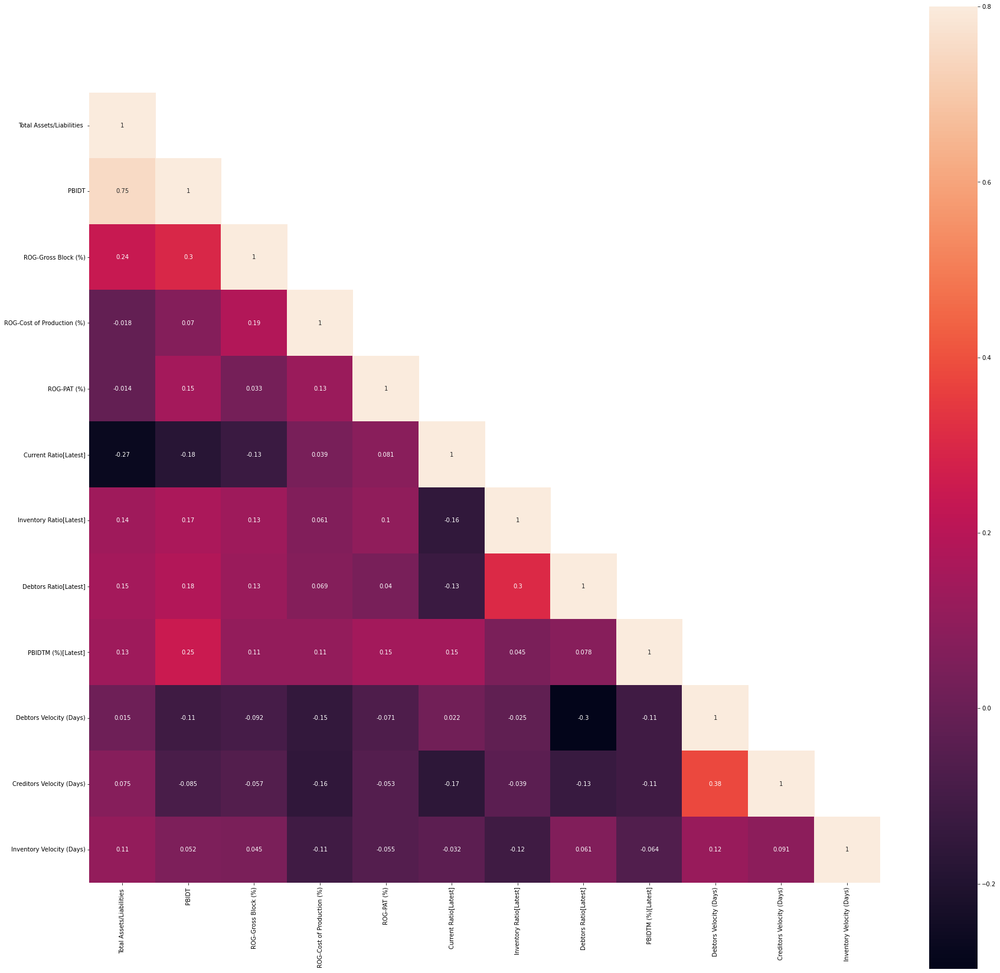

In [ ]:
#calculate column correlations and make a seaborn heatmap - Before standardisation

d = d1[['Total Assets/Liabilities ','PBIDT','ROG-Gross Block (%)','ROG-Cost of Production (%)','ROG-PAT (%)','Current Ratio[Latest]','Inventory Ratio[Latest]', 'Debtors Ratio[Latest]','PBIDTM (%)[Latest]','Debtors Velocity (Days)','Creditors Velocity (Days)', 'Inventory Velocity (Days)']]
cor = d.corr()
mask = np.array(cor)
mask[np.tril_indices_from(mask)] = False
fig,ax= plt.subplots()
fig.set_size_inches(30,30)
sns.heatmap(cor, mask=mask,vmax=.8, square=True,annot=True)
plt.show()

### Changing the names of the variables

In [ ]:
## Removing the spaces from the variables

d1.rename(columns = {'Networth Next Year':'Networth_Next_Year','Equity Paid Up':'Equity_Paid_Up','Capital Employed':'Capital_Employed','Total Debt':'Total_Debt','Gross Block ':'Gross_Block','Net Working Capital ':'Net_Working_Capital','Current Assets ':'Current_Assets','Current Liabilities and Provisions ':'CurrentLiabilitiesProvisions','Total Assets/Liabilities ':'Total_Assets_Liabilities','Gross Sales':'Gross_Sales','Net Sales':'Net_Sales','Other Income':'Other_Income','Value Of Output':'Value_Of_Output','Cost of Production':'Cost_of_Production','Selling Cost':'Selling_Cost','Adjusted PAT':'Adjusted_PAT','Revenue earnings in forex':'Revenue_earnings_forex','Revenue expenses in forex':'Revenue_expenses_forex','Capital expenses in forex':'Capital_expenses_forex','Book Value (Unit Curr)':'Book_Value','Book Value (Adj.) (Unit Curr)':'Book_Value_Adj','Market Capitalisation':'Market_Capitalisation','CEPS (annualised) (Unit Curr)':'CEPS','Cash Flow From Operating Activities':'Cash_Flow_Operating_Activities','Cash Flow From Investing Activities':'Cash_Flow_Investing_Activities','Cash Flow From Financing Activities':'Cash_Flow_Financing_Activities','ROG-Net Worth (%)':'ROG_Net_Worth','ROG-Capital Employed (%)':'ROG_Capital_Employed','ROG-Gross Block (%)':'ROG_Gross_Block','ROG-Gross Sales (%)':'ROG_Gross_Sales','ROG-Net Sales (%)':'ROG_Net_Sales','ROG-Cost of Production (%)':'ROG_Cost_Production','ROG-Total Assets (%)':'ROG_Total_Assets','ROG-PBIDT (%)':'ROG_PBIDT','ROG-PBIT (%)':'ROG_PBIT','ROG-PBT (%)':'ROG_PBT','ROG-PAT (%)':'ROG_PAT','ROG-CP (%)':'ROG_CP','ROG-Revenue earnings in forex (%)':'ROG_Revenue_earnings_forex','ROG-Revenue expenses in forex (%)':'ROG_Revenue_expenses_forex','ROG-Market Capitalisation (%)':'ROG_Market_Capitalisation','Current Ratio[Latest]':'Current_Ratio','Fixed Assets Ratio[Latest]':'Fixed_Assets_Ratio','Inventory Ratio[Latest]':'Inventory_Ratio','Debtors Ratio[Latest]':'Debtors_Ratio','Total Asset Turnover Ratio[Latest]':'Total_Asset_Turnover_Ratio','Interest Cover Ratio[Latest]':'Interest_Cover_Ratio','PBIDTM (%)[Latest]':'PBIDTM','PBITM (%)[Latest]':'PBITM','PBDTM (%)[Latest]':'PBDTM','CPM (%)[Latest]':'CPM','APATM (%)[Latest]':'APATM','Debtors Velocity (Days)':'Debtors_Velocity','Creditors Velocity (Days)':'Creditors_Velocity','Inventory Velocity (Days)':'Inventory_Velocity','Value of Output/Total Assets':'Value_Output_Total_Assets','Value of Output/Gross Block':'Value_Output_Gross_Block','ROG-PBDT (%)':'ROG_PBDT'}, inplace = True)

In [ ]:
print(d1.shape)

(3477, 68)


In [ ]:
d1.columns

Index(['Networth_Next_Year', 'Equity_Paid_Up', 'Networth', 'Capital_Employed',
       'Total_Debt', 'Gross_Block', 'Net_Working_Capital', 'Current_Assets',
       'CurrentLiabilitiesProvisions', 'Total_Assets_Liabilities',
       'Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output',
       'Cost_of_Production', 'Selling_Cost', 'PBIDT', 'PBDT', 'PBIT', 'PBT',
       'PAT', 'Adjusted_PAT', 'CP', 'Revenue_earnings_forex',
       'Revenue_expenses_forex', 'Capital_expenses_forex', 'Book_Value',
       'Book_Value_Adj', 'Market_Capitalisation', 'CEPS',
       'Cash_Flow_Operating_Activities', 'Cash_Flow_Investing_Activities',
       'Cash_Flow_Financing_Activities', 'ROG_Net_Worth',
       'ROG_Capital_Employed', 'ROG_Gross_Block', 'ROG_Gross_Sales',
       'ROG_Net_Sales', 'ROG_Cost_Production', 'ROG_Total_Assets', 'ROG_PBIDT',
       'ROG_PBDT', 'ROG_PBIT', 'ROG_PBT', 'ROG_PAT', 'ROG_CP',
       'ROG_Revenue_earnings_forex', 'ROG_Revenue_expenses_forex',
       'ROG_Market_Capita

#  Checking feature importance using Decision Tree and Logistic Regression Model on all the variables on the full data and check the summary statistics of the model. Check for multicollinearity in the predictor variables using Variance Inflation Factor (VIF)

In [ ]:
from sklearn import datasets
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
X = d1.drop('default', axis =1)
Y =d1['default']

In [ ]:
print(X.shape)

(3477, 67)


In [ ]:
print(Y.shape)

(3477,)


In [ ]:
d1.default.value_counts()

0    3100
1     377
Name: default, dtype: int64

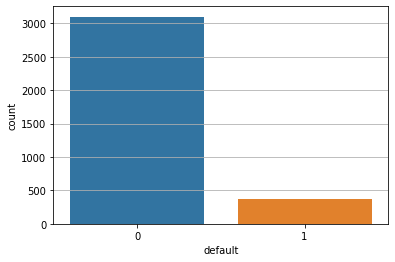

In [ ]:
sns.countplot(x='default', data=d1)

In [ ]:
dt = DecisionTreeClassifier(random_state=42, criterion='entropy', max_depth=10)

In [ ]:
dt.fit(X,Y)

DecisionTreeClassifier(criterion='entropy', max_depth=10, random_state=42)

In [ ]:
for i,cols in enumerate (d1.drop('default', axis = 1)):
    print (cols,dt.feature_importances_[i])

Networth_Next_Year 1.0
Equity_Paid_Up 0.0
Networth 0.0
Capital_Employed 0.0
Total_Debt 0.0
Gross_Block 0.0
Net_Working_Capital 0.0
Current_Assets 0.0
CurrentLiabilitiesProvisions 0.0
Total_Assets_Liabilities 0.0
Gross_Sales 0.0
Net_Sales 0.0
Other_Income 0.0
Value_Of_Output 0.0
Cost_of_Production 0.0
Selling_Cost 0.0
PBIDT 0.0
PBDT 0.0
PBIT 0.0
PBT 0.0
PAT 0.0
Adjusted_PAT 0.0
CP 0.0
Revenue_earnings_forex 0.0
Revenue_expenses_forex 0.0
Capital_expenses_forex 0.0
Book_Value 0.0
Book_Value_Adj 0.0
Market_Capitalisation 0.0
CEPS 0.0
Cash_Flow_Operating_Activities 0.0
Cash_Flow_Investing_Activities 0.0
Cash_Flow_Financing_Activities 0.0
ROG_Net_Worth 0.0
ROG_Capital_Employed 0.0
ROG_Gross_Block 0.0
ROG_Gross_Sales 0.0
ROG_Net_Sales 0.0
ROG_Cost_Production 0.0
ROG_Total_Assets 0.0
ROG_PBIDT 0.0
ROG_PBDT 0.0
ROG_PBIT 0.0
ROG_PBT 0.0
ROG_PAT 0.0
ROG_CP 0.0
ROG_Revenue_earnings_forex 0.0
ROG_Revenue_expenses_forex 0.0
ROG_Market_Capitalisation 0.0
Current_Ratio 0.0
Fixed_Assets_Ratio 0.0
Inve

# Check for multicollinearity in the predictor variables using Variance Inflation Factor (VIF).

In [ ]:
import statsmodels.formula.api as sm

In [ ]:
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=sm.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        if vif < 3:
            print (xvar_names[i], " VIF = " , vif)

In [ ]:
pd.set_option('display.max_rows',None)
vif_cal(input_data=d1.drop('default',axis=1))

Equity_Paid_Up  VIF =  2.91
Revenue_earnings_forex  VIF =  2.28
Revenue_expenses_forex  VIF =  2.77
Cash_Flow_Investing_Activities  VIF =  2.13
Cash_Flow_Financing_Activities  VIF =  2.72
ROG_Net_Worth  VIF =  2.78
ROG_Gross_Block  VIF =  1.38
ROG_Cost_Production  VIF =  1.95
ROG_Market_Capitalisation  VIF =  1.37
Current_Ratio  VIF =  1.49
Inventory_Ratio  VIF =  1.42
Debtors_Ratio  VIF =  1.45
Interest_Cover_Ratio  VIF =  2.05
Debtors_Velocity  VIF =  1.42
Creditors_Velocity  VIF =  1.4
Inventory_Velocity  VIF =  1.17
diff_net_worth  VIF =  2.39


Selecting the variables with least VIF as well as variables which might be most significant from domain perspective

PBIDT, ROG_PAT, Current_Ratio, Fixed_Assets_Ratio, Debtors_Ratio, Interest_Cover_Ratio, PBIDTM, diff_net_worth, leverage, Debtors_Velocity, Inventory_Ratio, Creditors_Velocity, ROG_Market_Capitalisation, ROG_Gross_Block, Inventory_Velocity, ROG_Cost_Production

In [ ]:
formula_1='default~PBIDT+ROG_PAT+Current_Ratio+Fixed_Assets_Ratio+Debtors_Ratio+Interest_Cover_Ratio+PBIDTM+diff_net_worth+leverage+Debtors_Velocity+Inventory_Ratio+Creditors_Velocity+ROG_Market_Capitalisation+ROG_Gross_Block+Inventory_Velocity+ROG_Cost_Production'

In [ ]:
Logistic_1 = sm.logit(formula=formula_1,data=d1).fit()

Optimization terminated successfully.
         Current function value: 0.210012
         Iterations 8


In [ ]:
Logistic_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 3477
Model:                          Logit   Df Residuals:                     3460
Method:                           MLE   Df Model:                           16
Date:                Fri, 04 Mar 2022   Pseudo R-squ.:                  0.3881
Time:                        09:05:53   Log-Likelihood:                -730.21
converged:                       True   LL-Null:                       -1193.4
Covariance Type:            nonrobust   LLR p-value:                6.669e-187
=============================================================================================
                                coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                    -0.2787      0.146     -1.911      0.056      -0.565       0.007
PBIDT                        -0.0408      0.005     -8.611      0.000      -0.050      -0.031
ROG_PAT                       0.0008      0.001      1.328      0.184      -0.000       0.002
Current_Ratio                -0.7200      0.072     -9.955      0.000      -0.862      -0.578
Fixed_Assets_Ratio           -0.1387      0.028     -4.940      0.000      -0.194      -0.084
Debtors_Ratio                -0.0165      0.012     -1.349      0.177      -0.040       0.007
Interest_Cover_Ratio         -0.1093      0.028     -3.967      0.000      -0.163      -0.055
PBIDTM                       -0.0131      0.004     -3.118      0.002      -0.021      -0.005
diff_net_worth               -0.0579      0.014     -4.266      0.000      -0.085      -0.031
leverage                      0.0572      0.013      4.379      0.000       0.032       0.083
Debtors_Velocity             -0.0044      0.001     -4.845      0.000      -0.006      -0.003
Inventory_Ratio              -0.0030      0.011     -0.261      0.794      -0.025       0.019
Creditors_Velocity            0.0032      0.001      3.388      0.001       0.001       0.005
ROG_Market_Capitalisation    -0.0014      0.002     -0.882      0.378      -0.005       0.002
ROG_Gross_Block              -0.0522      0.011     -4.654      0.000      -0.074      -0.030
Inventory_Velocity           -0.0018      0.001     -1.792      0.073      -0.004       0.000
ROG_Cost_Production          -0.0046      0.002     -2.135      0.033      -0.009      -0.000
=============================================================================================
"""

In [ ]:
#get odds ratio/ coefficients in a Logistic regression tell the log of odds of y happening w.r.t. that x variable
# np.exp() converts log of odds to odds (which are more interpretable and intuitive)
np.exp(Logistic_1.params)

Intercept                    0.756749
PBIDT                        0.960064
ROG_PAT                      1.000797
Current_Ratio                0.486771
Fixed_Assets_Ratio           0.870515
Debtors_Ratio                0.983641
Interest_Cover_Ratio         0.896481
PBIDTM                       0.986951
diff_net_worth               0.943716
leverage                     1.058824
Debtors_Velocity             0.995594
Inventory_Ratio              0.997024
Creditors_Velocity           1.003175
ROG_Market_Capitalisation    0.998588
ROG_Gross_Block              0.949176
Inventory_Velocity           0.998229
ROG_Cost_Production          0.995404
dtype: float64

Inventory_Velocity (0.418), Inventory_Ratio (0.996), ROG_Market_Capitalisation (0.295) is not an important variable and not highly associated with dependent variable

As ROG_PAT and Debtors ratio has high OR. This is selected even though P value is high, it is important from domain perspective. The given value suggests for one unit increase in ROG_PAT we expect that about 1.000601 times increase the odds of Defaulting the loan.

Pseudo R-squ.:	0.3885 - suggests this is ill-fitted model

# Model 2 - Drop the variable which has the highest p-value (least significant variable) 

dropping Inventory_Ratio ,  Inventory_Velocity, and ROG_Market_Capitalisation based on P value

In [ ]:
formula_2='default~PBIDT+ROG_PAT+Current_Ratio+Fixed_Assets_Ratio+Debtors_Ratio+Interest_Cover_Ratio+PBIDTM+diff_net_worth+leverage+Debtors_Velocity+Creditors_Velocity+ROG_Gross_Block+ROG_Cost_Production'

In [ ]:
Logistic_2 = sm.logit(formula=formula_2,data=d1).fit()

Optimization terminated successfully.
         Current function value: 0.210638
         Iterations 8


In [ ]:
Logistic_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 3477
Model:                          Logit   Df Residuals:                     3463
Method:                           MLE   Df Model:                           13
Date:                Fri, 04 Mar 2022   Pseudo R-squ.:                  0.3863
Time:                        09:07:11   Log-Likelihood:                -732.39
converged:                       True   LL-Null:                       -1193.4
Covariance Type:            nonrobust   LLR p-value:                1.005e-188
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               -0.3241      0.144     -2.256      0.024      -0.606      -0.043
PBIDT                   -0.0413      0.005     -8.727      0.000      -0.051      -0.032
ROG_PAT                  0.0008      0.001      1.367      0.172      -0.000       0.002
Current_Ratio           -0.7310      0.073     -9.954      0.000      -0.875      -0.587
Fixed_Assets_Ratio      -0.1400      0.028     -4.985      0.000      -0.195      -0.085
Debtors_Ratio           -0.0210      0.011     -1.854      0.064      -0.043       0.001
Interest_Cover_Ratio    -0.1105      0.027     -4.024      0.000      -0.164      -0.057
PBIDTM                  -0.0126      0.004     -2.988      0.003      -0.021      -0.004
diff_net_worth          -0.0573      0.013     -4.248      0.000      -0.084      -0.031
leverage                 0.0521      0.013      4.076      0.000       0.027       0.077
Debtors_Velocity        -0.0047      0.001     -5.212      0.000      -0.006      -0.003
Creditors_Velocity       0.0030      0.001      3.232      0.001       0.001       0.005
ROG_Gross_Block         -0.0528      0.011     -4.744      0.000      -0.075      -0.031
ROG_Cost_Production     -0.0043      0.002     -2.007      0.045      -0.009      -0.000
========================================================================================
"""

In [ ]:
vif_cal(input_data=d1.drop(['ROG_Market_Capitalisation', 'Networth_Next_Year', 'Equity_Paid_Up', 'Networth', 'Capital_Employed','Total_Debt', 'Gross_Block', 'Net_Working_Capital', 'Current_Assets','CurrentLiabilitiesProvisions', 'Total_Assets_Liabilities','Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output','Cost_of_Production', 'Selling_Cost', 'PBDT', 'PBIT', 'PBT','PAT', 'Adjusted_PAT', 'CP', 'Revenue_earnings_forex','Revenue_expenses_forex', 'Capital_expenses_forex', 'Book_Value','Book_Value_Adj', 'Market_Capitalisation', 'CEPS','Cash_Flow_Operating_Activities', 'Cash_Flow_Investing_Activities','Cash_Flow_Financing_Activities', 'ROG_Net_Worth','ROG_Capital_Employed', 'ROG_Gross_Sales','ROG_Net_Sales','ROG_Total_Assets', 'ROG_PBIDT','ROG_PBDT', 'ROG_PBIT', 'ROG_PBT', 'ROG_CP','ROG_Revenue_earnings_forex', 'ROG_Revenue_expenses_forex','Inventory_Ratio', 'Total_Asset_Turnover_Ratio','PBITM', 'PBDTM', 'CPM', 'APATM','Inventory_Velocity','Value_Output_Total_Assets', 'Value_Output_Gross_Block', 'default',
] ,axis=1))

PBIDT  VIF =  1.98
ROG_Gross_Block  VIF =  1.18
ROG_Cost_Production  VIF =  1.12
ROG_PAT  VIF =  1.08
Current_Ratio  VIF =  1.27
Fixed_Assets_Ratio  VIF =  1.11
Debtors_Ratio  VIF =  1.2
Interest_Cover_Ratio  VIF =  1.52
PBIDTM  VIF =  1.27
Debtors_Velocity  VIF =  1.3
Creditors_Velocity  VIF =  1.24
leverage  VIF =  1.45
diff_net_worth  VIF =  1.73


# Model 3 - Drop the variable which has the highest p-value (least significant variable)

Dropping the variables Debtors ratio with P value - 0.064  and ROG_Cost_Production 0.045. We will keep ROG_PAT even though it has high P value , it is important from domain perspective

In [ ]:
formula_3='default~PBIDT+ROG_PAT+Current_Ratio+Fixed_Assets_Ratio+Interest_Cover_Ratio+PBIDTM+diff_net_worth+leverage+Debtors_Velocity+Creditors_Velocity+ROG_Gross_Block'

In [ ]:
Logistic_3 = sm.logit(formula=formula_3,data=d1).fit()

Optimization terminated successfully.
         Current function value: 0.211753
         Iterations 8


In [ ]:
Logistic_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 3477
Model:                          Logit   Df Residuals:                     3465
Method:                           MLE   Df Model:                           11
Date:                Fri, 04 Mar 2022   Pseudo R-squ.:                  0.3830
Time:                        09:13:55   Log-Likelihood:                -736.26
converged:                       True   LL-Null:                       -1193.4
Covariance Type:            nonrobust   LLR p-value:                5.552e-189
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               -0.4462      0.134     -3.333      0.001      -0.709      -0.184
PBIDT                   -0.0415      0.005     -8.772      0.000      -0.051      -0.032
ROG_PAT                  0.0009      0.001      1.450      0.147      -0.000       0.002
Current_Ratio           -0.7330      0.074     -9.850      0.000      -0.879      -0.587
Fixed_Assets_Ratio      -0.1563      0.028     -5.596      0.000      -0.211      -0.102
Interest_Cover_Ratio    -0.1124      0.027     -4.144      0.000      -0.166      -0.059
PBIDTM                  -0.0135      0.004     -3.203      0.001      -0.022      -0.005
diff_net_worth          -0.0592      0.013     -4.412      0.000      -0.086      -0.033
leverage                 0.0496      0.013      3.934      0.000       0.025       0.074
Debtors_Velocity        -0.0042      0.001     -4.757      0.000      -0.006      -0.002
Creditors_Velocity       0.0032      0.001      3.500      0.000       0.001       0.005
ROG_Gross_Block         -0.0570      0.011     -5.184      0.000      -0.079      -0.035
========================================================================================
"""

In [ ]:
vif_cal(input_data=d1.drop(['ROG_Market_Capitalisation','Debtors_Ratio', 'ROG_Cost_Production', 'Networth_Next_Year', 'Equity_Paid_Up', 'Networth', 'Capital_Employed','Total_Debt', 'Gross_Block', 'Net_Working_Capital', 'Current_Assets','CurrentLiabilitiesProvisions', 'Total_Assets_Liabilities','Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output','Cost_of_Production', 'Selling_Cost', 'PBDT', 'PBIT', 'PBT','PAT', 'Adjusted_PAT', 'CP', 'Revenue_earnings_forex','Revenue_expenses_forex', 'Capital_expenses_forex', 'Book_Value','Book_Value_Adj', 'Market_Capitalisation', 'CEPS','Cash_Flow_Operating_Activities', 'Cash_Flow_Investing_Activities','Cash_Flow_Financing_Activities', 'ROG_Net_Worth','ROG_Capital_Employed', 'ROG_Gross_Sales','ROG_Net_Sales','ROG_Total_Assets', 'ROG_PBIDT','ROG_PBDT', 'ROG_PBIT', 'ROG_PBT', 'ROG_CP','ROG_Revenue_earnings_forex', 'ROG_Revenue_expenses_forex','Inventory_Ratio', 'Total_Asset_Turnover_Ratio','PBITM', 'PBDTM', 'CPM', 'APATM','Inventory_Velocity','Value_Output_Total_Assets', 'Value_Output_Gross_Block', 'default',
] ,axis=1))

PBIDT  VIF =  1.98
ROG_Gross_Block  VIF =  1.15
ROG_PAT  VIF =  1.07
Current_Ratio  VIF =  1.26
Fixed_Assets_Ratio  VIF =  1.07
Interest_Cover_Ratio  VIF =  1.48
PBIDTM  VIF =  1.26
Debtors_Velocity  VIF =  1.21
Creditors_Velocity  VIF =  1.23
leverage  VIF =  1.45
diff_net_worth  VIF =  1.73


# Split the data into Train and Test dataset in a ratio of 67:33 and use random_state =42. Model. Building on Train Dataset and Model Validation is to be done on Test Dataset.

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
Train,Test = train_test_split(d1,test_size=0.33,random_state=42,stratify=d1['default'])

In [ ]:
Train.shape

(2329, 68)

In [ ]:
Test.shape

(1148, 68)

In [ ]:
Train['default'].value_counts(1)

0    0.89137
1    0.10863
Name: default, dtype: float64

In [ ]:
Test['default'].value_counts(1)

0    0.891986
1    0.108014
Name: default, dtype: float64

# Build the models on the training data

Building Model 1  on Training data set

'PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Inventory_Ratio','Creditors_Velocity','ROG_Market_Capitalisation','ROG_Gross_Block','Inventory_Velocity','ROG_Cost_Production'

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
from sklearn import metrics

In [ ]:
LR = LogisticRegression(solver='newton-cg',penalty='none')

In [ ]:
model_1 = LR.fit(Train[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Inventory_Ratio','Creditors_Velocity','ROG_Market_Capitalisation','ROG_Gross_Block','Inventory_Velocity','ROG_Cost_Production']],Train['default'])

Model 1 - Accurancy of the model

In [ ]:
print('Accuracy Score of Model 1:',model_1.score(Train[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Inventory_Ratio','Creditors_Velocity','ROG_Market_Capitalisation','ROG_Gross_Block','Inventory_Velocity','ROG_Cost_Production']],Train['default']))

Accuracy Score of Model 1: 0.91412623443538


Model 1 - Predicting the classes and the probabilities on the Test Data

In [ ]:
model_1_test_class = model_1.predict(Test[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Inventory_Ratio','Creditors_Velocity','ROG_Market_Capitalisation','ROG_Gross_Block','Inventory_Velocity','ROG_Cost_Production']])
model_1_test_probabilities = model_1.predict_proba(Test[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Inventory_Ratio','Creditors_Velocity','ROG_Market_Capitalisation','ROG_Gross_Block','Inventory_Velocity','ROG_Cost_Production']])

In [ ]:
type(model_1_test_probabilities[:,1])

numpy.ndarray

In [ ]:
model_1_pred = []
for i in range(0,len(model_1_test_probabilities[:,1])):
  if model_1_test_probabilities[:,1][i] >=0.042:
    model_1_pred.append(1)
  else:
    model_1_pred.append(0)


In [ ]:
print('Model 1')
print(metrics.classification_report(Test['default'],model_1_pred),'\n')

Model 1
              precision    recall  f1-score   support

           0       0.98      0.62      0.76      1024
           1       0.22      0.90      0.36       124

    accuracy                           0.65      1148
   macro avg       0.60      0.76      0.56      1148
weighted avg       0.90      0.65      0.72      1148
 



In [ ]:
model_1_pred

[0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,


Model 2 

 dropping Inventory_Ratio , Inventory_Velocity and ROG_Market_Capitalisation based on P value

In [ ]:
model_2 = LR.fit(Train[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Creditors_Velocity','ROG_Gross_Block','ROG_Cost_Production']],Train['default'])

In [ ]:
print('Accuracy Score of Model 2:',model_2.score(Train[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Creditors_Velocity','ROG_Gross_Block','ROG_Cost_Production']],Train['default']))

Accuracy Score of Model 2: 0.9154143409188493


Model 2 - Predicting the classes and the probabilities on the Test Data

In [ ]:
model_2_test_class = model_2.predict(Test[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Creditors_Velocity','ROG_Gross_Block','ROG_Cost_Production']])
model_2_test_probabilities = model_2.predict_proba(Test[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Creditors_Velocity','ROG_Gross_Block','ROG_Cost_Production']])

Model 3

Dropping the variables Debtors ratio with P value - 0.217  and ROG_Cost_Production 0.052. We will keep ROG_PAT even though it has high P value , it is important from domain perspective.

After removing the debtors_ratio the model accuracy was going down hence we will just drop the ROG_Cost_Production.

In [ ]:
model_3 = LR.fit(Train[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Creditors_Velocity','ROG_Gross_Block']],Train['default'])

In [ ]:
print('Accuracy Score of Model 3:',model_3.score(Train[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Creditors_Velocity','ROG_Gross_Block']],Train['default']))

Accuracy Score of Model 3: 0.9179905538857879


In [ ]:
model_3_test_class = model_3.predict(Test[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Creditors_Velocity','ROG_Gross_Block']])
model_3_test_probabilities = model_3.predict_proba(Test[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Creditors_Velocity','ROG_Gross_Block']])

# Evaluate the models on the test data using the various statistics of the confusion matrix

Confusion Matrix summary statistics Evaluation on the Test Data

In [ ]:
print('Model 1')
tn, fp, fn, tp = metrics.confusion_matrix(Test['default'],model_1_test_class).ravel()
print('True Negative:',tn,'\n''False Positives:' ,fp,'\n''False Negatives:', fn,'\n''True Positives:', tp,'\n\n')

print('Model 2')
tn, fp, fn, tp = metrics.confusion_matrix(Test['default'],model_2_test_class).ravel()
print('True Negative:',tn,'\n''False Positives:' ,fp,'\n''False Negatives:', fn,'\n''True Positives:', tp,'\n\n')

print('Model 3')
tn, fp, fn, tp = metrics.confusion_matrix(Test['default'],model_3_test_class).ravel()
print('True Negative:',tn,'\n''False Positives:' ,fp,'\n''False Negatives:', fn,'\n''True Positives:', tp)

Model 1
True Negative: 1001 
False Positives: 23 
False Negatives: 78 
True Positives: 46 


Model 2
True Negative: 1000 
False Positives: 24 
False Negatives: 78 
True Positives: 46 


Model 3
True Negative: 997 
False Positives: 27 
False Negatives: 80 
True Positives: 44


In [ ]:
print('Model 1')
print(metrics.classification_report(Test['default'],model_1_test_class),'\n')

Model 1
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      1024
           1       0.67      0.37      0.48       124

    accuracy                           0.91      1148
   macro avg       0.80      0.67      0.71      1148
weighted avg       0.90      0.91      0.90      1148
 



In [ ]:
print('Model 2')
print(metrics.classification_report(Test['default'],model_2_test_class),'\n')

Model 2
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      1024
           1       0.66      0.37      0.47       124

    accuracy                           0.91      1148
   macro avg       0.79      0.67      0.71      1148
weighted avg       0.90      0.91      0.90      1148
 



In [ ]:
print('Model 3')
print(metrics.classification_report(Test['default'],model_3_test_class))

Model 3
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1024
           1       0.62      0.35      0.45       124

    accuracy                           0.91      1148
   macro avg       0.77      0.66      0.70      1148
weighted avg       0.89      0.91      0.90      1148



# Check the summary statistics of the AUC-ROC curve for all the three Logistic Regression Models built for the test data

In [ ]:
from pylab import rcParams
rcParams['figure.figsize'] = 10,8

Model 1 AUC: 0.89441


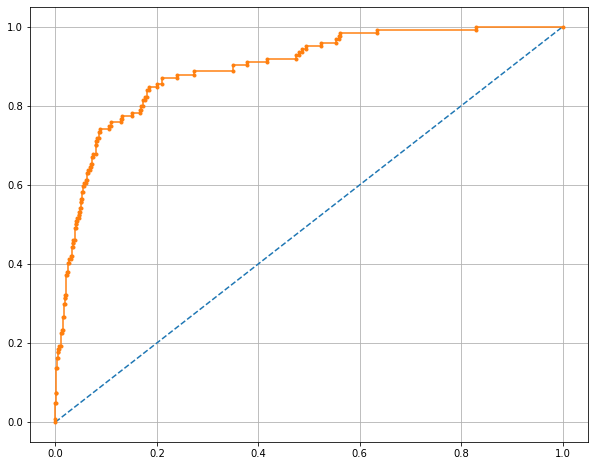

Model 2 AUC: 0.89324


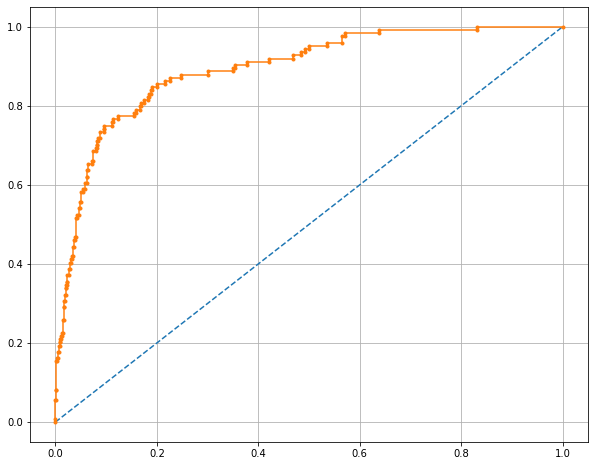

Model 3 AUC: 0.89389


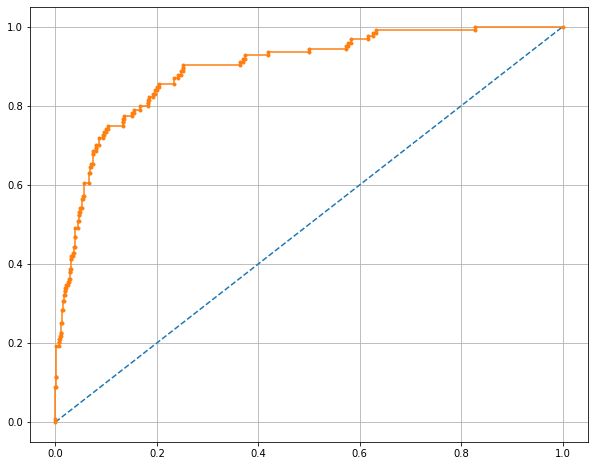

In [ ]:
# AUC and ROC for the model 1


# calculating on the basis of a person not defaulting
# calculate AUC
auc = metrics.roc_auc_score(Test['default'],model_1_test_probabilities[:, 1])#keeping only the probabilities for the desired class outcome
print('Model 1 AUC: %.5f' % auc)
# # calculate roc curve
# from sklearn.metrics import roc_curve
fpr, tpr, thresholds1 = metrics.roc_curve(Test['default'],model_1_test_probabilities[:, 1])#keeping only the probabilities for the desired 
#class outcome
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()


# AUC and ROC for the model 2


# calculating on the basis of a person not defaulting
# calculate AUC
auc = metrics.roc_auc_score(Test['default'],model_2_test_probabilities[:, 1])#keeping only the probabilities for the desired class outcome
print('Model 2 AUC: %.5f' % auc)
# # calculate roc curve
# from sklearn.metrics import roc_curve
fpr, tpr, thresholds2 = metrics.roc_curve(Test['default'],model_2_test_probabilities[:, 1])#keeping only the probabilities for the desired 
#class outcome
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

# AUC and ROC for the model 3


# calculating on the basis of a person not defaulting
# calculate AUC
auc = metrics.roc_auc_score(Test['default'],model_3_test_probabilities[:, 1])#keeping only the probabilities for the desired class outcome
print('Model 3 AUC: %.5f' % auc)
# # calculate roc curve
# from sklearn.metrics import roc_curve
fpr, tpr, thresholds3 = metrics.roc_curve(Test['default'],model_3_test_probabilities[:, 1])#keeping only the probabilities for the desired 
#class outcome
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

In [ ]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds1[optimal_idx]

In [ ]:
optimal_threshold

0.04211766811406666

# LDA

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier

In [ ]:
LDA = LinearDiscriminantAnalysis()

In [ ]:
lda_model = LDA.fit(X,Y)

In [ ]:
pred_train_lda = lda_model.predict(X)

In [ ]:
pred_train_lda

array([1, 1, 1, ..., 0, 0, 0])

In [ ]:
print(metrics.classification_report(Y, pred_train_lda))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      3100
           1       0.86      0.58      0.69       377

    accuracy                           0.94      3477
   macro avg       0.91      0.78      0.83      3477
weighted avg       0.94      0.94      0.94      3477



In [ ]:
y_train =Train['default']
x_train =Train.drop(columns='default', axis = 1) 

In [ ]:
y_test =Test['default']
x_test =Test.drop(columns='default', axis = 1) 

In [ ]:
x_train

,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Current_Assets,CurrentLiabilitiesProvisions,Total_Assets_Liabilities,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_forex,Revenue_expenses_forex,Capital_expenses_forex,Book_Value,Book_Value_Adj,Market_Capitalisation,CEPS,Cash_Flow_Operating_Activities,Cash_Flow_Investing_Activities,Cash_Flow_Financing_Activities,ROG_Net_Worth,ROG_Capital_Employed,ROG_Gross_Block,ROG_Gross_Sales,ROG_Net_Sales,ROG_Cost_Production,ROG_Total_Assets,ROG_PBIDT,ROG_PBDT,ROG_PBIT,ROG_PBT,ROG_PAT,ROG_CP,ROG_Revenue_earnings_forex,ROG_Revenue_expenses_forex,ROG_Market_Capitalisation,Current_Ratio,Fixed_Assets_Ratio,Inventory_Ratio,Debtors_Ratio,Total_Asset_Turnover_Ratio,Interest_Cover_Ratio,PBIDTM,PBITM,PBDTM,CPM,APATM,Debtors_Velocity,Creditors_Velocity,Inventory_Velocity,Value_Output_Total_Assets,Value_Output_Gross_Block,leverage,diff_net_worth
3139,296.495,17.47,279.25,546.30,182.74,331.16,151.40,332.26,163.085,748.655,605.135,584.185,9.22,589.04,479.275,9.875,55.74,17.700,22.930,-10.695,-8.205,-7.81,16.78,19.05,17.925,0.0,48.530,48.53,268.00,1.920,32.05,-12.655,-15.62,-20.665,-3.490,3.190,10.51,10.10,5.47,-2.730,4.690,125.770,32.160,1.280,-8.64,-41.80,0.0,0.0,-27.09,0.910,0.780,3.720,5.040,0.670,0.100,9.61,1.140,-1.92,-1.92,-10.390,67.0,87.0,112.0,0.48,0.62,17.244533,15.69
865,3.750,0.70,3.56,3.56,0.00,7.27,0.51,0.78,0.280,3.840,0.000,0.000,0.80,0.00,0.490,0.000,0.02,0.020,0.000,0.000,0.000,-0.07,0.02,0.00,0.000,0.0,51.060,51.06,0.00,0.290,-0.56,0.250,0.00,-0.280,-0.280,-0.410,0.00,0.00,16.67,0.520,154.785,178.195,100.000,100.000,100.00,176.05,0.0,0.0,0.00,0.050,0.000,0.000,0.000,0.000,0.000,0.00,0.000,0.00,0.00,0.000,0.0,7.0,57.0,0.00,0.00,0.000000,0.19
1269,7.890,8.35,7.67,7.67,0.00,0.03,7.14,8.48,1.330,9.000,5.160,5.160,0.56,5.16,5.140,0.010,0.50,0.490,0.490,0.480,0.330,0.33,0.34,0.00,0.000,0.0,9.180,0.92,106.13,0.410,-1.84,2.060,-0.08,5.500,5.500,0.000,65.94,66.26,68.66,22.620,117.390,113.040,113.040,108.700,106.25,112.50,0.0,0.0,0.00,1.790,11.415,0.000,0.180,0.150,0.000,20.17,19.330,20.17,20.17,17.975,73.0,42.0,0.0,0.11,11.73,0.000000,0.22
3536,296.495,42.49,279.25,546.30,182.74,331.16,151.40,332.26,163.085,748.655,605.135,584.185,9.22,589.04,479.275,9.875,55.74,31.125,39.825,17.665,13.515,12.75,26.30,19.05,17.925,0.0,165.295,138.48,268.00,21.675,32.05,-12.655,10.06,13.990,14.970,16.625,2.89,2.91,8.01,13.490,-10.270,-10.050,-16.150,-16.070,-13.11,-6.21,0.0,0.0,36.41,1.620,1.200,5.540,2.340,0.660,9.275,24.04,16.480,23.45,21.80,14.240,168.0,50.0,111.0,0.62,1.43,17.244533,15.69
3383,296.495,42.49,279.25,546.30,182.74,331.16,-89.24,332.26,163.085,748.655,605.135,584.185,9.22,589.04,479.275,5.180,55.74,-18.675,-23.895,-10.695,-8.205,-7.81,-15.78,19.05,17.925,0.0,30.180,30.18,268.00,-1.950,32.05,-12.655,10.06,-4.920,12.780,16.625,-52.54,-52.94,-51.91,8.070,-84.430,-156.325,-119.360,-197.315,-208.63,-153.07,0.0,0.0,61.50,0.410,0.080,0.750,20.805,0.050,-0.230,12.88,-21.135,-20.76,-16.86,-10.785,253.0,213.0,195.0,0.05,0.10,8.600657,-9.59
958,4.530,5.10,4.25,5.15,0.90,0.05,0.25,0.26,0.020,5.170,0.180,0.180,0.00,0.18,0.140,0.000,0.05,0.050,0.030,0.030,0.020,0.02,0.04,0.00,0.000,0.0,8.330,8.33,0.00,0.080,0.05,-0.010,0.00,0.470,0.390,0.000,-21.74,-21.74,68.66,0.780,66.670,66.670,50.000,50.000,0.00,33.33,0.0,0.0,0.00,1.430,3.550,4.370,3.950,1.120,4.040,8.07,7.750,6.15,4.59,4.280,253.0,0.0,2.0,1.27,5.15,0.176471,0.28
3027,296.495,24.22,279.25,546.30,182.74,331.16,151.40,332.26,163.085,748.655,605.135,584.185,0.65,589.04,479.275,9.875,55.74,31.125,39.825,17.665,13.515,12.75,26.30,19.05,17.925,0.0,125.410,125.41,268.00,21.675,32.05,-12.655,-5.49,21.040,24.170,16.625,12.09,11.88,16.51,13.790,14.540,14.880,15.810,16.800,25.75,20.52,0.0,0.0,117.70,1.060,1.590,6.690,3.970,1.410,3.800,15.24,12.160,12.04,9.33,6.240,91.0,56.0,58.0,1.12,1.61,17.244533,15.69
2893,219.000,0.31

In [ ]:
lda_model_1 = LDA.fit(x_train,y_train)

In [ ]:
pred_train_lda_1 = lda_model_1.predict(x_train)

In [ ]:
print(metrics.classification_report(y_train, pred_train_lda_1))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      2076
           1       0.88      0.59      0.71       253

    accuracy                           0.95      2329
   macro avg       0.92      0.79      0.84      2329
weighted avg       0.94      0.95      0.94      2329



In [ ]:
pred_test_lda_1 = lda_model_1.predict(x_test)

In [ ]:
print(metrics.classification_report(y_test, pred_test_lda_1))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      1024
           1       0.81      0.53      0.64       124

    accuracy                           0.94      1148
   macro avg       0.88      0.76      0.80      1148
weighted avg       0.93      0.94      0.93      1148



# Fine tuning for F1 score, accuracy and recall rate for target "1"

In [ ]:
Logistic_1_test_predict = Logistic_1.predict(Test[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Inventory_Ratio','Creditors_Velocity','ROG_Market_Capitalisation','ROG_Gross_Block','Inventory_Velocity','ROG_Cost_Production']])
# Logistic_1_test_probabilities = Logistic_1.predict_proba(Test[['PBIDT','ROG_PAT','Current_Ratio','Fixed_Assets_Ratio','Debtors_Ratio','Interest_Cover_Ratio','PBIDTM','diff_net_worth','leverage','Debtors_Velocity','Inventory_Ratio','Creditors_Velocity','ROG_Market_Capitalisation','ROG_Gross_Block','Inventory_Velocity','ROG_Cost_Production']])

In [ ]:
Logistic_1_test_predict.head(5)

436     0.029195
157     0.086034
2568    0.001206
2749    0.073931
363     0.806560
dtype: float64

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
for j in np.arange(0.1,0.99,0.1):
  y_pred_test=[]
  for i in Logistic_1_test_predict:
    if i > j:
      y_pred_test.append(1)
    else:
      y_pred_test.append(0)
  print ('cut-off:', round(j,4), 'accuracy_score:', accuracy_score(Test['default'],y_pred_test))

cut-off: 0.1 accuracy_score: 0.8022648083623694
cut-off: 0.2 accuracy_score: 0.877177700348432
cut-off: 0.3 accuracy_score: 0.9024390243902439
cut-off: 0.4 accuracy_score: 0.9067944250871081
cut-off: 0.5 accuracy_score: 0.9137630662020906
cut-off: 0.6 accuracy_score: 0.9102787456445993
cut-off: 0.7 accuracy_score: 0.9094076655052264
cut-off: 0.8 accuracy_score: 0.9050522648083623
cut-off: 0.9 accuracy_score: 0.8972125435540069


In [ ]:
y_pred_test=[]

for i in Logistic_1_test_predict:
  if i >= 0.20:
    y_pred_test.append(1)
  else:
    y_pred_test.append(0)

In [ ]:
print('Logistic 1')
print(metrics.classification_report(Test['default'],y_pred_test),'\n')

Logistic 1
              precision    recall  f1-score   support

           0       0.97      0.89      0.93      1024
           1       0.46      0.75      0.57       124

    accuracy                           0.88      1148
   macro avg       0.71      0.82      0.75      1148
weighted avg       0.91      0.88      0.89      1148
 



Best Trade-off between recall and f1

In [ ]:
y_pred_test=[]

for i in Logistic_1_test_predict:
  if i > 0.25:
    y_pred_test.append(1)
  else:
    y_pred_test.append(0)


In [ ]:
print('Logistic 1')
print(metrics.classification_report(Test['default'],y_pred_test),'\n')

Logistic 1
              precision    recall  f1-score   support

           0       0.97      0.91      0.94      1024
           1       0.50      0.73      0.59       124

    accuracy                           0.89      1148
   macro avg       0.73      0.82      0.76      1148
weighted avg       0.92      0.89      0.90      1148
 



Best F1 score and accuracy

In [ ]:
y_pred_test=[]

for i in Logistic_1_test_predict:
  if i >= 0.30:
    y_pred_test.append(1)
  else:
    y_pred_test.append(0)

In [ ]:
print('Logistic 1')
print(metrics.classification_report(Test['default'],y_pred_test),'\n')

Logistic 1
              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1024
           1       0.54      0.67      0.60       124

    accuracy                           0.90      1148
   macro avg       0.75      0.80      0.77      1148
weighted avg       0.91      0.90      0.91      1148
 



In [ ]:
type(Logistic_1_test_predict)

pandas.core.series.Series

In [ ]:
y_pred_test=[]

for i in Logistic_1_test_predict:
  if i >= 0.10:
    y_pred_test.append(1)
  else:
    y_pred_test.append(0)

In [ ]:
print('Logistic 1')
print(metrics.classification_report(Test['default'],y_pred_test),'\n')

Logistic 1
              precision    recall  f1-score   support

           0       0.98      0.79      0.88      1024
           1       0.34      0.86      0.49       124

    accuracy                           0.80      1148
   macro avg       0.66      0.83      0.68      1148
weighted avg       0.91      0.80      0.84      1148
 



In [ ]:
print('Model 1')
print(metrics.classification_report(Test['default'],model_1_test_class),'\n')

Model 1
              precision    recall  f1-score   support

           0       0.93      0.98      0.95      1024
           1       0.67      0.37      0.48       124

    accuracy                           0.91      1148
   macro avg       0.80      0.67      0.71      1148
weighted avg       0.90      0.91      0.90      1148
 



In [ ]:
model_1_test_probabilities[:,1]

array([0.02123555, 0.06477405, 0.00194965, ..., 0.01548091, 0.01129555,
       0.97009424])

In [ ]:
model_1_pred = []
for i in range(0,len(model_1_test_probabilities[:,1])):
  if model_1_test_probabilities[:,1][i] >=0.30:
    model_1_pred.append(1)
  else:
    model_1_pred.append(0)

In [ ]:
print('Model 1')
print(metrics.classification_report(Test['default'],model_1_pred),'\n')

Model 1
              precision    recall  f1-score   support

           0       0.96      0.93      0.94      1024
           1       0.53      0.67      0.59       124

    accuracy                           0.90      1148
   macro avg       0.74      0.80      0.77      1148
weighted avg       0.91      0.90      0.90      1148
 

